In [1]:
import pandas as pd
import altair as alt

alt.renderers.enable('notebook')
alt.data_transformers.enable('default', max_rows=None) 

DataTransformerRegistry.enable('default')

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/OlexandrBratus/Introduction-to-Data-Visualization/master/Homework_3/pitchfork.csv')
df.head()

,artist,album,genre,primary,score,date,author,role
0,David Byrne,“…The Best Live Show of All Time” — NME EP,Rock,Rock,5.5,2019-01-11,Andy Beta,Contributor
1,DJ Healer,Lost Lovesongs / Lostsongs Vol. 2,Electronic,Electronic,6.2,2019-01-11,Chal Ravens,Contributor
2,Jorge Velez,Roman Birds,Electronic,Electronic,7.9,2019-01-10,Philip Sherburne,Contributing Editor
3,Chandra,Transportation EPs,Rock,Rock,7.8,2019-01-10,Andy Beta,Contributor
4,The Chainsmokers,Sick Boy,Electronic,Electronic,3.1,2019-01-09,Larry Fitzmaurice,Contributor


## (1) Relation between number of reviews and average score by primary genre and year

In [3]:
bg_color = '#F3F7F7'
titlecolor = '#3A3F4A'
titlesize = 30
subtitlesize = 16
textcolor = '#000000'
textsize = 14
color_scale = ('#67001f', '#f7f7f7', '#053061')
font = 'Ubuntu Mono'

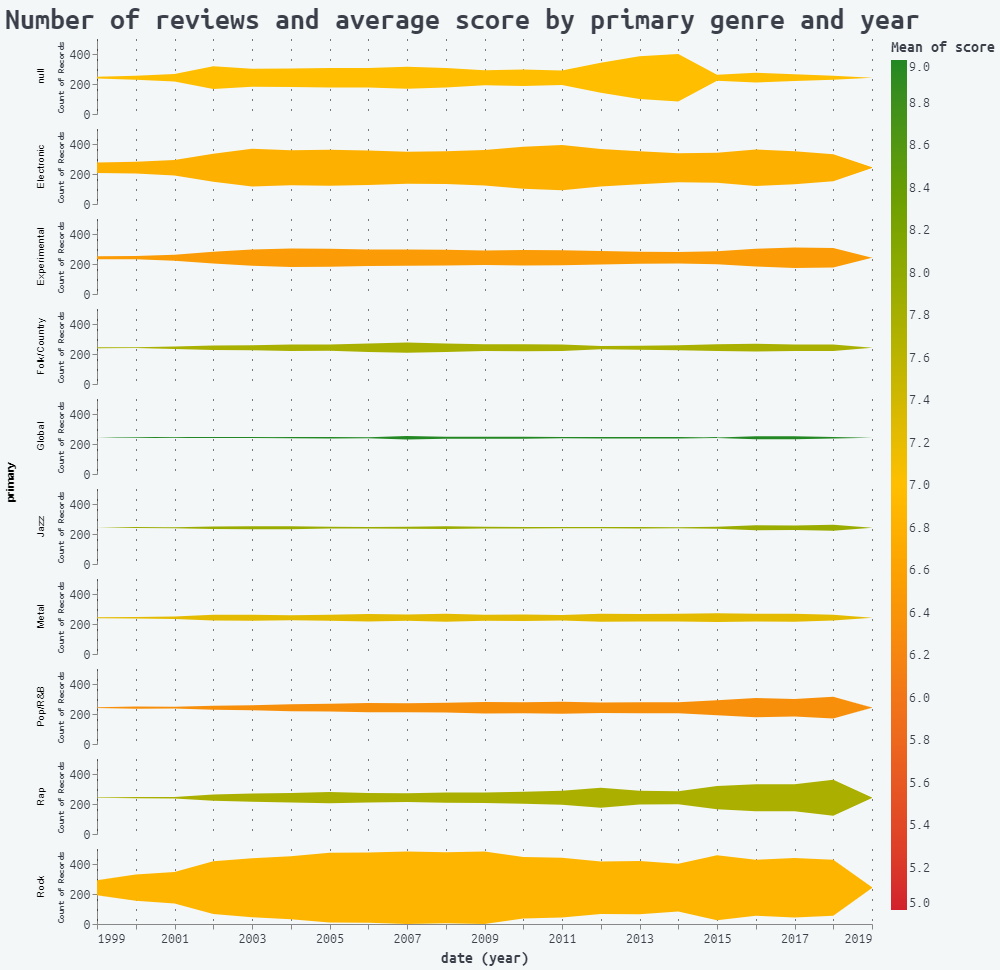

In [4]:
chart1 = alt.Chart(df).mark_area().encode(
    x = alt.X('year(date):T'),
    y = alt.Y('count()', stack='center'),
    color = alt.Color('mean(score):Q',
                      scale=alt.Scale(domain=[5,7,9], range=('#d2222d', '#ffbf00', '#238823')),
                      legend=alt.Legend(
                          labelFont=font,
                          labelColor=titlecolor,
                          labelFontSize=textsize,
                          titleFont=font,
                          titleColor=titlecolor,
                          titleFontSize=subtitlesize,
                          gradientLength=850
                      )
    )
).properties(
    width = 775, 
    height = 75,
    
).facet(
    row=alt.Row('primary:N')
).properties(
    background=bg_color,
    bounds='flush'
).configure_facet(
    spacing=15
).configure_view(
    stroke=None
).configure_axis(
    grid=False,
    labelFontSize=textsize,
    titleFontSize=subtitlesize
).configure_axisX(
    grid=True,
    gridColor=textcolor,
    gridDash=(1,9),
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor,
).configure_axisY(
    gridColor=textcolor,
    titleFontSize=9,
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor,
).configure_title(
    fontSize=titlesize,
    font=font,
    color=titlecolor
)

chart1.title = "Number of reviews and average score by primary genre and year"
chart1

## (2) 10 best bands/artists by score

In [5]:
artists = df.groupby('artist').count().reset_index().artist.tolist()
dff = df[df['artist'].isin(artists)].groupby('artist').mean().sort_values('score', ascending=False).head(10)

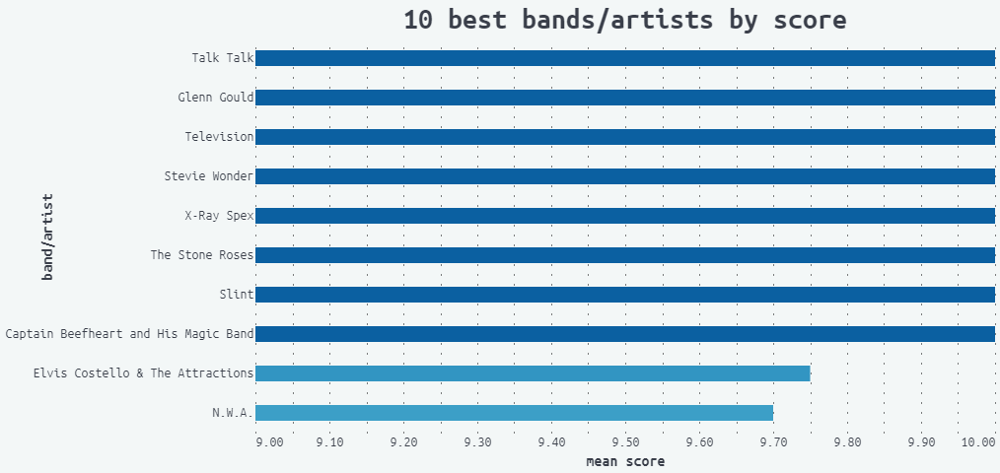

In [6]:
chart2 = alt.Chart(dff.reset_index()).mark_bar(height=16).encode(
    x=alt.X('score:Q',
            scale=alt.Scale(domain=[9,10])
    ),
    y=alt.Y('artist:N',
            sort=alt.Sort(field='score',order='descending')
    ),
    color=alt.Color('score:Q',
                    scale=alt.Scale(domain=[9, 9.5, 10], scheme='greenblue'),
                    legend=None
                   )
) .properties(
    background=bg_color,
    height=400,
    width=750
).configure_axis(
    grid=False,
    ticks=False,
    domain=False,
    labelColor=textcolor,
    titleColor=textcolor,
    titleFont=font,
    labelFont=font,
    labelFontSize=textsize,
    titleFontSize=subtitlesize
).configure_view(
    stroke=None
).configure_axisX(
    grid=True,
    gridColor=textcolor,
    gridDash=(1,9),
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor
).configure_axisY(
    labelFontSize=textsize,
    labelLimit=400,
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor
).configure_title(
    fontSize=titlesize,
    font=font,
    color=titlecolor
)

chart2.title = '10 best bands/artists by score'
chart2.encoding.x.title = 'mean score'
chart2.encoding.y.title = 'band/artist'
chart2

## (3) Number / distribution of reviews with score equals or above 8 by primary genre

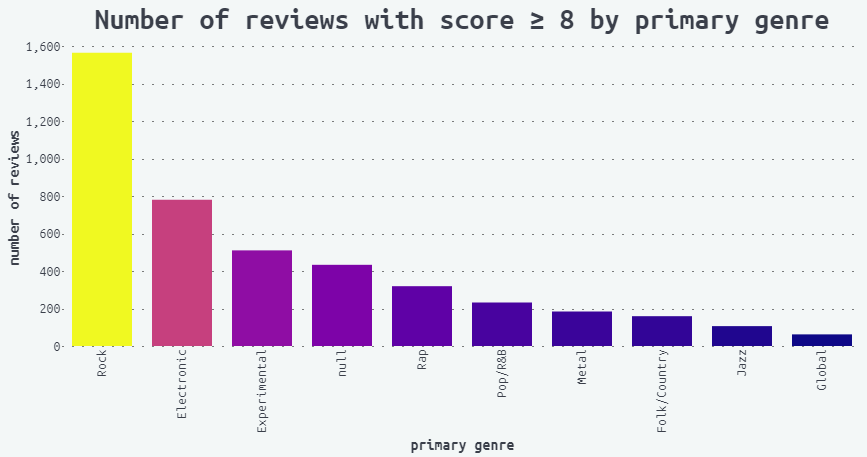

In [7]:
chart3 = alt.Chart(df[df.score >= 8]).mark_bar(width=60).encode(
    x = alt.X('primary:N',
              sort=alt.Sort(field='primary', op='count', order='descending')
    ),
    y = alt.Y('count()'),
    color = alt.Color('count()', scale=alt.Scale(scheme='plasma'), legend=None)
).properties(
    background=bg_color,
    height=300,
    width=800
).configure_axis(
    grid=False,
    ticks=False,
    domain=False,
    labelColor=textcolor,
    titleColor=textcolor,
    titleFont=font,
    labelFont=font,
    labelFontSize=textsize,
    titleFontSize=subtitlesize
).configure_view(
    stroke=None
).configure_axisX(
    gridColor=textcolor,
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor
).configure_axisY(
    grid=True,
    gridColor=textcolor,
    gridDash=(1,9),
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor
).configure_title(
    fontSize=titlesize,
    font=font,
    color=titlecolor
)

chart3.title = 'Number of reviews with score ≥ 8 by primary genre'
chart3.encoding.x.title = 'primary genre'
chart3.encoding.y.title = 'number of reviews'
chart3

## (4) Number / distribution of reviews with score equals or below 2 by primary genre

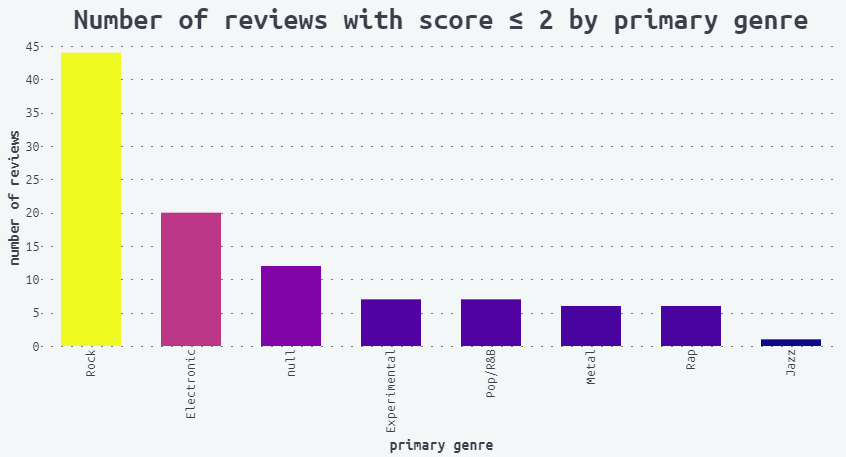

In [8]:
chart4 = alt.Chart(df[df.score <= 2]).mark_bar(width=60).encode(
    x = alt.X('primary:N',
              sort=alt.Sort(field='primary', op='count', order='descending')
    ),
    y = alt.Y('count()'),
    color = alt.Color('count()', scale=alt.Scale(scheme='plasma'), legend=None)
).properties(
    background=bg_color,
    height=300,
    width=800
).configure_axis(
    grid=False,
    ticks=False,
    domain=False,
    labelColor=textcolor,
    titleColor=textcolor,
    titleFont=font,
    labelFont=font,
    labelFontSize=textsize,
    titleFontSize=subtitlesize
).configure_view(
    stroke=None
).configure_axisX(
    gridColor=textcolor,
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor
).configure_axisY(
    grid=True,
    gridColor=textcolor,
    gridDash=(1,9),
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor
).configure_title(
    fontSize=titlesize,
    font=font,
    color=titlecolor
)

chart4.title = 'Number of reviews with score ≤ 2 by primary genre'
chart4.encoding.x.title = 'primary genre'
chart4.encoding.y.title = 'number of reviews'
chart4

## (5) Genre's rank (by number of reviews) and it's number of reviews by year

In [9]:
titlesize = 24
subtitlesize = 14
textsize = 12

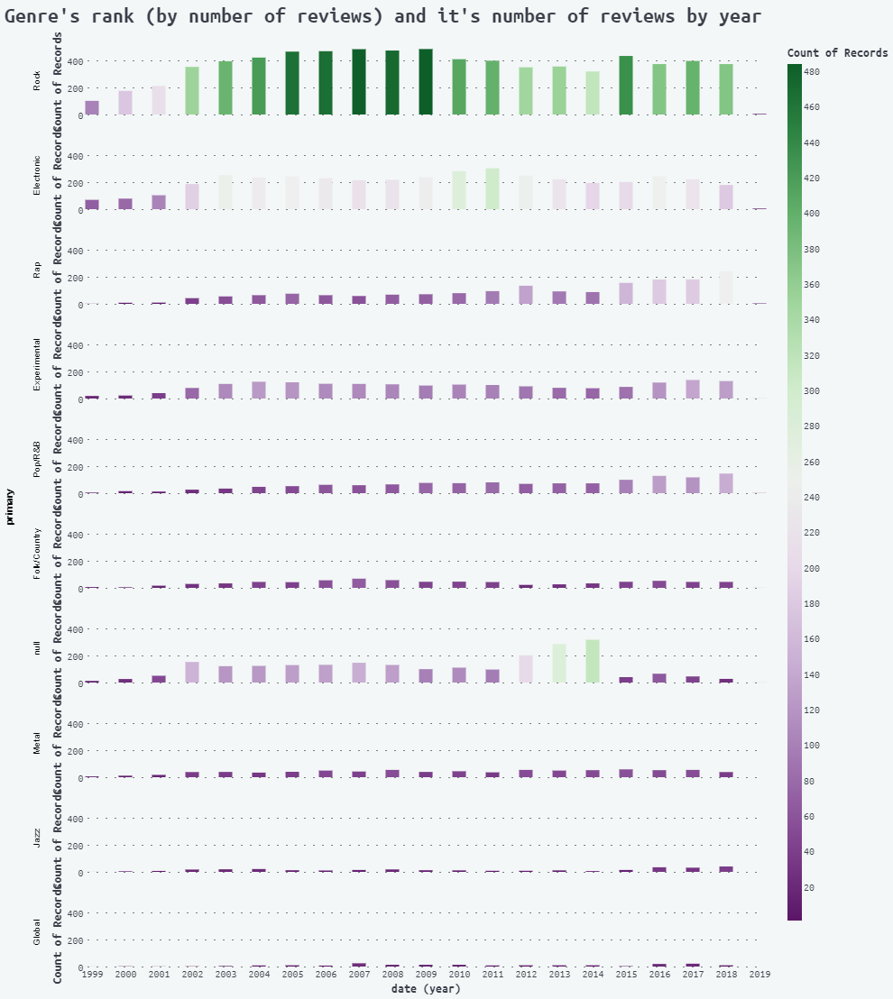

In [10]:
chart5 = alt.Chart(df).mark_bar(width=15).encode(
    x = 'year(date):T',
    y = 'count():N',
    color = alt.Color('count():N',
                      scale=alt.Scale(scheme='purplegreen'),
                      legend=alt.Legend(
                          labelFont=font,
                          labelColor=titlecolor,
                          labelFontSize=textsize,
                          titleFont=font,
                          titleColor=titlecolor,
                          titleFontSize=subtitlesize,
                          gradientLength=950
                      )
                     )
).properties(
    width=750,
    height=75
).facet(
    row=alt.Row('primary:N', sort=alt.Sort(field='primary', op='count', order='descending')),
    columns=5
).properties(
    background=bg_color
).configure_facet(
    spacing=30
).configure_axis(
    grid=False,
    labelFont=font,
    labelColor=textcolor,
    labelFontSize=textsize,
    domain=False,
    ticks = False,
    tickWidth=.5,
    gridColor=textcolor,
    titleColor=textcolor,
    titleFont=font, 
    titleFontSize=subtitlesize,
).configure_title(
    fontSize=titlesize,
    font=font,
    color=titlecolor
).configure_view(
    stroke=None
).configure_axisX(
    gridColor=textcolor,
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor
).configure_axisY(
    grid=True,
    gridColor=textcolor,
    gridDash=(1,9),
    labelFont=font,
    labelColor=titlecolor,
    titleFont=font,
    titleColor=titlecolor
)

chart5.title = "Genre's rank (by number of reviews) and it's number of reviews by year"
chart5